<center>
<img src="../../img/ods_stickers.jpg">
## Открытый курс по машинному обучению
<center>
Автор материала: Екатерина Демидова, Data Scientist @ Segmento <br>


Материал распространяется на условиях лицензии [Creative Commons CC BY-NC-SA 4.0](https://creativecommons.org/licenses/by-nc-sa/4.0/). Можно использовать в любых целях (редактировать, поправлять и брать за основу), кроме коммерческих, но с обязательным упоминанием автора материала.
Автор материала: 

# <center>Домашнее задание № 2 (демо). <br> Визуальный анализ данных о публикациях на Хабрахабре</center>

**Заполните код в клетках и ответьте на вопросы в [веб-форме](https://docs.google.com/forms/d/1y8qj5iYpaVhczjWnZuHd5NRR_sdCGy3eTF5n-qPKknQ).**

In [19]:
import pandas as pd
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
from pylab import rcParams
rcParams['figure.figsize'] = 25, 20
import datetime

## Загрузка и знакомство с данными

Для работы вам понадобятся предобработанные данные нашего учебного конкурса на kaggle [«Прогноз популярности статьи на Хабре»](https://www.kaggle.com/c/howpop-habrahabr-favs).

In [2]:
df = pd.read_csv('../../data/howpop_train.csv')
#df = pd.read_csv('../../data/habr_sample_submission.csv')

In [3]:
df.shape

(134137, 17)

In [4]:
df.head(3).T

,0,1,2
url,https://habrahabr.ru/post/18284/,https://habrahabr.ru/post/18285/,https://habrahabr.ru/post/18286/
domain,habrahabr.ru,habrahabr.ru,habrahabr.ru
post_id,18284,18285,18286
published,2008-01-01 18:19:00,2008-01-01 18:30:00,2008-01-01 18:34:00
author,@Tapac,@DezmASter,@DezmASter
flow,develop,design,design
polling,False,False,False
content_len,4305,7344,8431
title,Новогодний подарок блоггерам — WordPress 2.3.2,"Сумасшедшие яйца, или сервис для отслеживания ...","Сумасшедшие яйца, или сервис для отслеживания ..."
comments,0,1,47


Избавимся сразу от переменных, названия которых заканчиваются на `_lognorm` (нужны для соревнования на Kaggle). Выберем их с помощью `filter()` и удалим `drop`-ом:

In [5]:
df.drop(filter(lambda c: c.endswith('_lognorm'), df.columns), 
        axis = 1,       # axis = 1: столбцы 
        inplace = True) # избавляет от необходимости сохранять датасет

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
post_id,134137.0,181307.054265,81766.350702,18284.0,115565.0,182666.0,257401.0,314088.0
content_len,134137.0,7516.929699,8724.771640,1.0,2179.0,4949.0,9858.0,352471.0
comments,134137.0,39.625994,62.398958,0.0,7.0,19.0,48.0,2266.0
favs,134137.0,71.999866,145.854135,0.0,8.0,27.0,78.0,8718.0
views,134137.0,16631.013084,31479.819691,3.0,2100.0,7600.0,18700.0,1730000.0
votes_plus,133566.0,35.536888,42.461073,0.0,11.0,22.0,45.0,1466.0
votes_minus,133566.0,8.050035,11.398282,0.0,2.0,5.0,10.0,445.0


In [7]:
df.describe(include = ['object', 'bool'] # бинарные и категориальные переменные
           ).T

,count,unique,top,freq
url,134137,134137,https://habrahabr.ru/post/99319/,1
domain,134137,2,habrahabr.ru,97048
published,134137,130291,2011-06-14 15:52:00,39
author,97657,22077,@alizar,5292
flow,97048,6,develop,53318
polling,134137,2,False,129412
title,134137,133628,"Интересные события, произошедшие в выходные",56


In [8]:
# настройка внешнего вида графиков в seaborn
sns.set_style("dark")
sns.set_palette("RdBu")
sns.set_context("notebook", font_scale = 1.5, 
                rc = { "figure.figsize" : (15, 5), "axes.titlesize" : 18 })

Столбец **`published`** (время публикации) содержит строки. Чтобы мы могли работать с этими данными как с датой/временем публикации, приведём их к типу `datetime`:

In [9]:
print(df['published'].dtype)
df['published'] = pd.to_datetime(df.published, yearfirst = True)
print(df.published.dtype)

object
datetime64[ns]


Создадим несколько столбцов на основе данных о времени публикации:

In [10]:
df['year'] = [d.year for d in df.published]
df['month'] = [d.month for d in df.published]

df['dayofweek'] = [d.isoweekday() for d in df.published]
df['hour'] = [d.hour for d in df.published]

-----
Теперь Ваша очередь. В каждом пункте предлагается построить картинку и с ее помощью ответить на вопрос в [форме](https://docs.google.com/forms/d/e/1FAIpQLSf3b5OG8zX_nLQBQ-t20c6M5Auz-VUL-yxj8Fm9_o_XWDBTrg/viewform?c=0&w=1). Конечно, можно попытаться ответить на все вопросы только с Pandas, без картинок, но мы советуем Вам потренироваться строить (красивые) визуализации.   

## 1\. В каком месяце (и какого года) было больше всего публикаций?

* март 2016
* март 2015
* апрель 2015
* апрель 2016

<AxesSubplot:xlabel='year,month'>

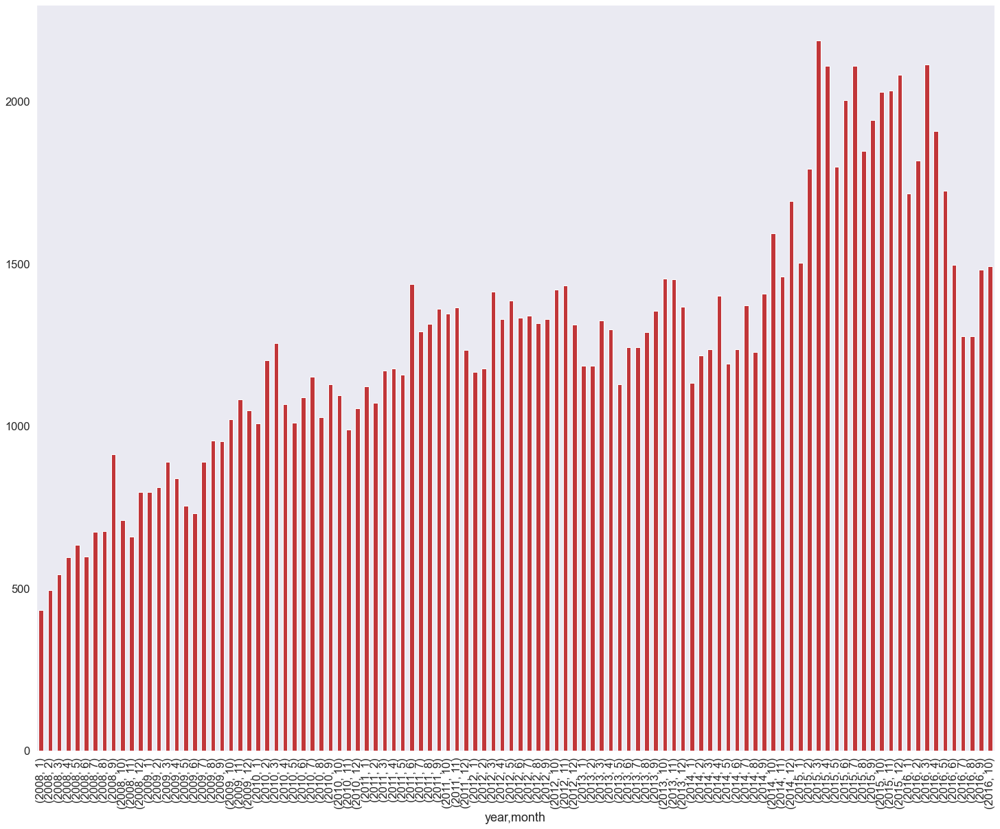

In [32]:
df.groupby(['year', 'month'])['post_id'].count().plot(kind='bar', rot=90)
#sns.counplot()
#for mo_ye, sub_df in df.groupby(['month', 'year']):
#    print(mo_ye)
#    print(len(sub_df))
#Март 2016? Нет, март 2015

## 2\. Проанализируйте публикации в месяце из предыдущего вопроса

Выберите один или несколько вариантов:

* Один или несколько дней сильно выделяются из общей картины
* На хабре _всегда_ больше статей, чем на гиктаймсе
* По субботам на гиктаймс и на хабрахабр публикуют примерно одинаковое число статей

Подсказки: постройте график зависимости числа публикаций от дня; используйте параметр `hue`; не заморачивайтесь сильно с ответами и не ищите скрытого смысла :)

<AxesSubplot:xlabel='date', ylabel='count'>

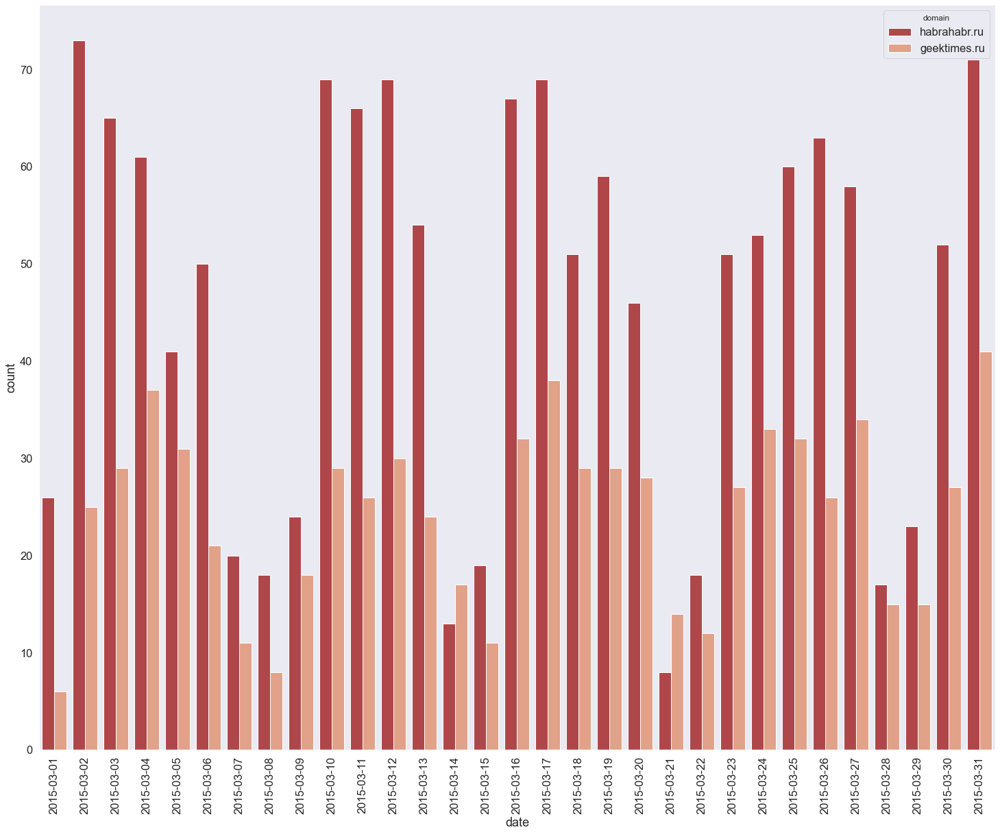

In [99]:
#date_time.dt.date.head()
#df[(df['year'] == 2016) & (df['month'] == 3)].head()
df['date'] = df['published'].dt.date
popular_month = df[(df['year'] == 2015) & (df['month'] == 3)]
labels = list(set(popular_month['date'].values))
labels.sort()
g = sns.countplot(popular_month['date'], hue=popular_month['domain'])
g.set_xticklabels(labels, rotation=90)
g
#df[(df['year'] == 2016) & (df['month'] == 3)].groupby(['date', 'domain']).count().plot(kind='bar', rot=90);
#sns.countplot(df[(df['year'] == 2016) & (df['month'] == 3)].groupby('date'), hue=df['domain'])
#sns.countplot(df[], hue=df['domain'])

#+1 -2 -3? Нет, -1 -2 +3

## 3\. Когда лучше всего публиковать статью?

* Больше всего просмотров набирают статьи, опубликованные в 12 часов дня
* У опубликованных в 10 утра постов больше всего комментариев
* Больше всего просмотров набирают статьи, опубликованные в 6 часов утра
* Максимальное число комментариев на гиктаймсе набрала статья, опубликованная в 9 часов вечера
* На хабре дневные статьи комментируют чаще, чем вечерние

In [65]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly
import plotly.graph_objs as go

init_notebook_mode(connected=True)
df['time'] = df['published'].dt.time
df['hour'] = df['published'].dt.hour
df1 = df.sort_values(by=['time'])
#df1['hour'].head()

trace0 = go.Scatter(
    x=df1.time,
    y=df1.views,
    name='Views'
)

trace1 = go.Scatter(
    x=df1.time,
    y=df1.comments,
    name='Comments'
)

data = [trace0, trace1]
layout = {'title': 'Statistics of articles'}

#fig = go.Figure()
#for group, sub_df in df1.groupby('domain'):
#    print(type(group))
#    if group == 'habrahabr.ru':
#        #fig.add_scatter(x=sub_df['time'], y=sub_df['views'], name=group + ' views', mode='lines')
#        fig.add_scatter(x=sub_df['time'], y=sub_df['comments'], name=group + ' comments', mode='lines')
    

fig = go.Figure(data=data, layout=layout)

iplot(fig, show_link=False)
#-1 -2 -3 -4 +5 неправильно

<AxesSubplot:xlabel='hour'>

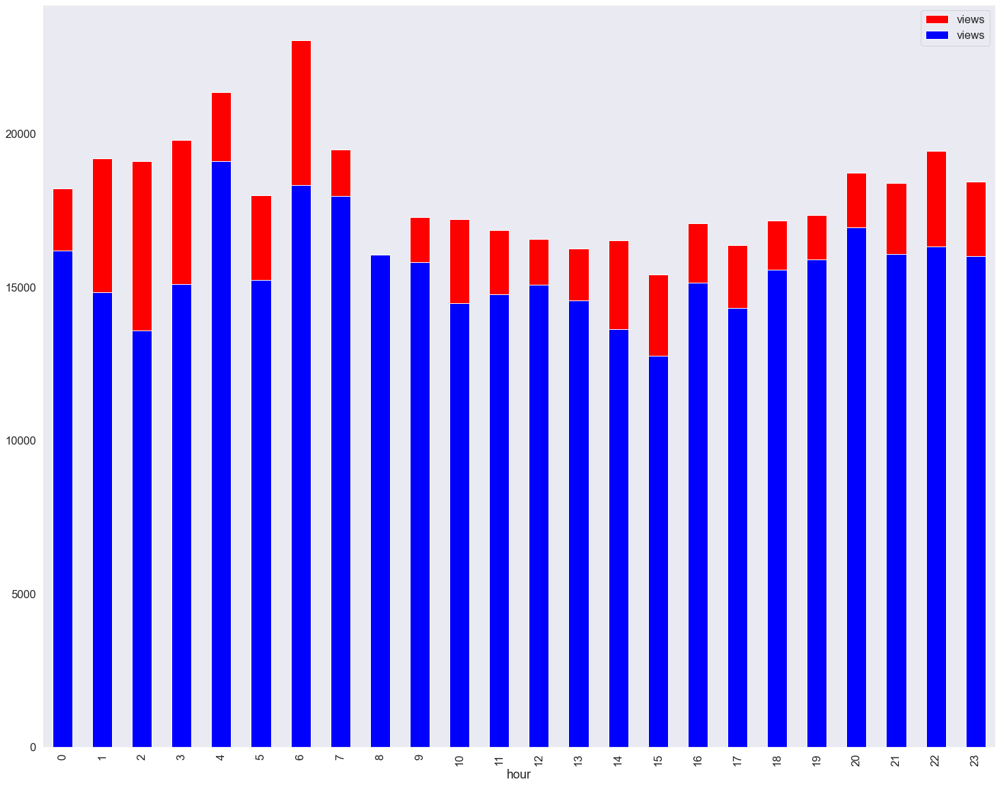

In [75]:
#Просмотры
df[df['domain'] == 'habrahabr.ru'].groupby('hour')['views'].mean().plot(kind='bar', rot=90, legend=True, color='red')
df[df['domain'] == 'geektimes.ru'].groupby('hour')['views'].mean().plot(kind='bar', rot=90, legend=True, color='blue')
#-1 +3 

<AxesSubplot:xlabel='hour'>

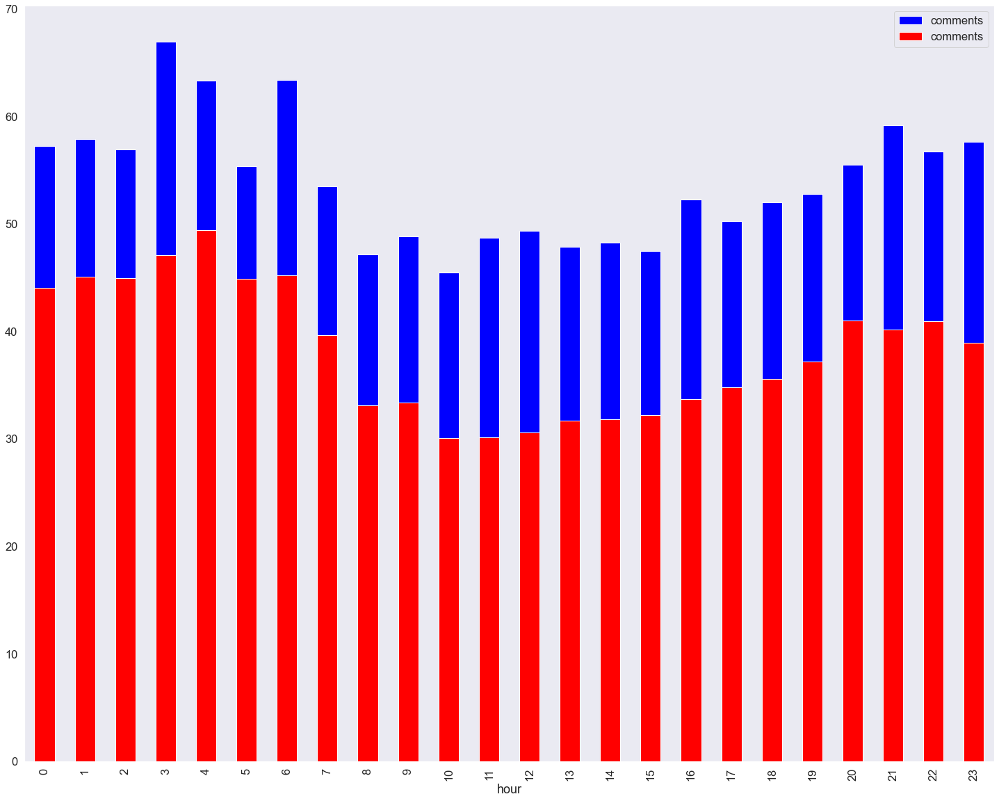

In [82]:
#Комментарии
df[df['domain'] == 'geektimes.ru'].groupby('hour')['comments'].mean().plot(kind='bar', rot=90, legend=True, color='blue')
df[df['domain'] == 'habrahabr.ru'].groupby('hour')['comments'].mean().plot(kind='bar', rot=90, legend=True, color='red')
#-2 -4 -5

## 4\. Кого из топ-20 авторов чаще всего минусуют?

* @Mordatyj
* @Mithgol
* @alizar
* @ilya42

@Mithgol
20.481081081081083
@Mordatyj
7.471454880294659
@alizar
7.928191489361702
@ilya42
6.216796875


<AxesSubplot:xlabel='author'>

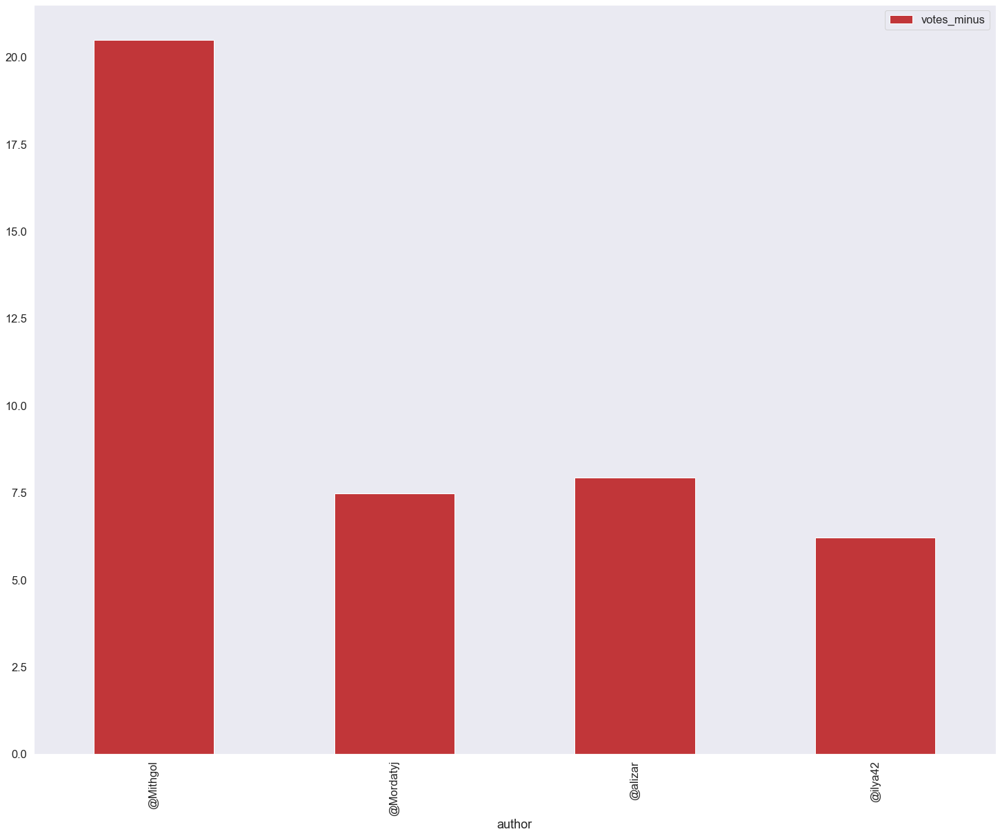

In [62]:
top_authors = ['@Mordatyj', '@Mithgol', '@alizar', '@ilya42']
df_top_authors = df[df['author'].isin(top_authors)]
for author, sub_df in df_top_authors.groupby('author'):
    print(author)
    print(sub_df['votes_minus'].mean())
df_top_authors[['votes_minus']+['author']].groupby('author').mean().plot(kind='bar')
#@alizar

## 5\. Сравните субботы и понедельники

Правда ли, что по субботам авторы пишут в основном днём, а по понедельникам — в основном вечером?

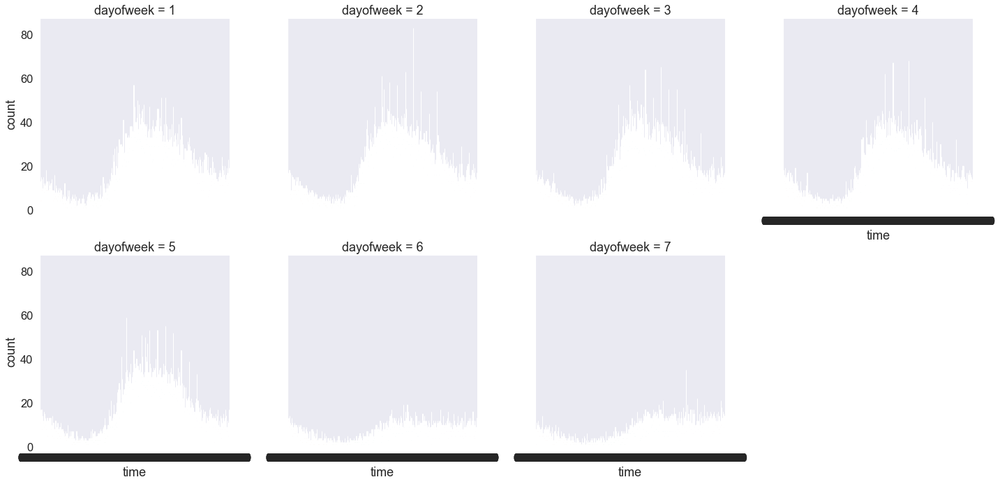

In [17]:
df1 = df.sort_values(by=['time'])
sns.catplot('time', col='dayofweek', col_wrap=4, data = df1,kind="count")#, height=2.5, aspect=.8)
#Нет

In [16]:
df1['time'].value_counts()

15:52:00    342
13:52:00    312
14:52:00    286
12:52:00    286
11:52:00    278
           ... 
03:46:00      9
05:42:00      7
05:45:00      7
06:54:00      6
05:50:00      1
Name: time, Length: 1440, dtype: int64